# EfficientDet Object Detection Model from TensorFlow Hub

In [1]:
import os
import numpy as np
import cv2
import zipfile
import requests
import glob as glob

import tensorflow_hub as hub
import matplotlib
import matplotlib.pyplot as plt
import warnings
import logging
import absl

# Filter absl warnings
warnings.filterwarnings("ignore", module="absl")

# Capture all warnings in the logging system
logging.captureWarnings(True)

# Set the absl logger level to 'error' to suppress warnings
absl_logger = logging.getLogger("absl")
absl_logger.setLevel(logging.ERROR)

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

## 1 download sample images

In [2]:
def download_file(url, save_name):
    url = url
    file = requests.get(url)

    open(save_name, 'wb').write(file.content)

In [3]:
def unzip(zip_file=None):
    try:
        with zipfile.ZipFile(zip_file) as z:
            z.extractall("./")
            print("Extracted all")
    except:
        print("Invalid file")

In [4]:
download_file(
    'https://www.dropbox.com/s/h7l1lmhvga6miyo/object_detection_images.zip?dl=1',
    'object_detection_images.zip'
    )

unzip(zip_file='object_detection_images.zip')

Extracted all


### Display sample images

In [5]:
image_paths = sorted(glob.glob('object_detection_images' + '/*.png'))

for idx in range(len(image_paths)):
    print(image_paths[idx])

object_detection_images\dog_bicycle_car.png
object_detection_images\elephants.png
object_detection_images\home_interior.png
object_detection_images\place_setting.png


In [6]:
def load_image(path):

    image = cv2.imread(path)

    #convert image in BGR fromat to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Add batch dimension required by the model
    image = np.expand_dims(image, axis = 0) # /255.0

    return image

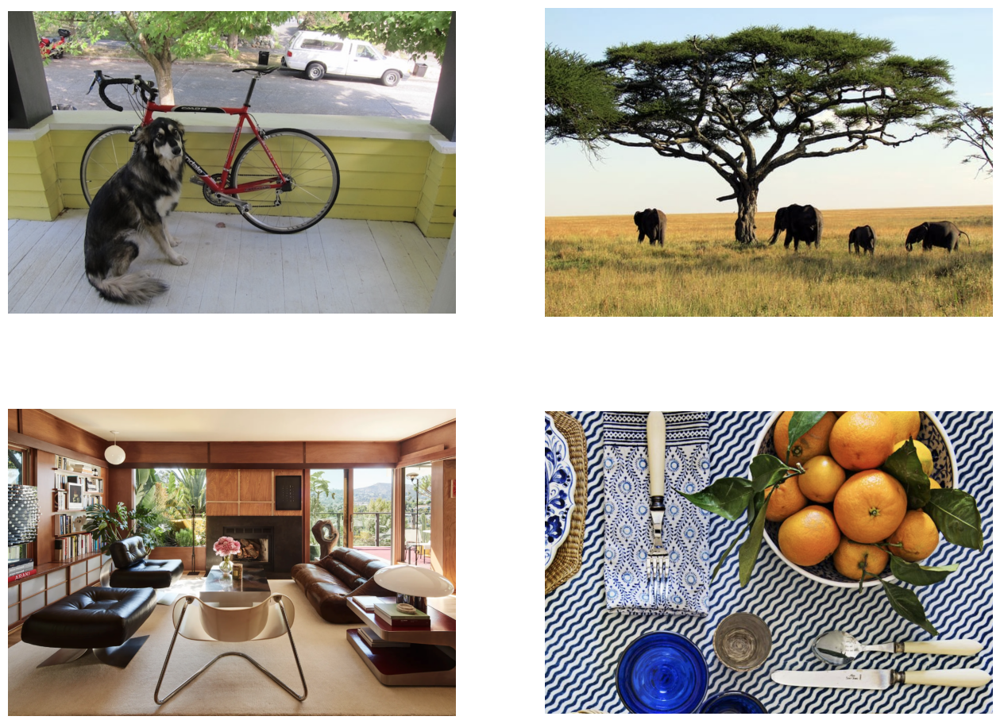

In [7]:
images = []
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12))

for idx, axis in enumerate(ax.flat):
    image = load_image(image_paths[idx])
    images.append(image)
    axis.imshow(image[0])
    axis.axis('off')

### Define dictionary to map class IDs to class names

In [8]:
class_index =  \
{
         1: 'person',
         2: 'bicycle',
         3: 'car',
         4: 'motorcycle',
         5: 'airplane',
         6: 'bus',
         7: 'train',
         8: 'truck',
         9: 'boat',
         10: 'traffic light',
         11: 'fire hydrant',
         13: 'stop sign',
         14: 'parking meter',
         15: 'bench',
         16: 'bird',
         17: 'cat',
         18: 'dog',
         19: 'horse',
         20: 'sheep',
         21: 'cow',
         22: 'elephant',
         23: 'bear',
         24: 'zebra',
         25: 'giraffe',
         27: 'backpack',
         28: 'umbrella',
         31: 'handbag',
         32: 'tie',
         33: 'suitcase',
         34: 'frisbee',
         35: 'skis',
         36: 'snowboard',
         37: 'sports ball',
         38: 'kite',
         39: 'baseball bat',
         40: 'baseball glove',
         41: 'skateboard',
         42: 'surfboard',
         43: 'tennis racket',
         44: 'bottle',
         46: 'wine glass',
         47: 'cup',
         48: 'fork',
         49: 'knife',
         50: 'spoon',
         51: 'bowl',
         52: 'banana',
         53: 'apple',
         54: 'sandwich',
         55: 'orange',
         56: 'broccoli',
         57: 'carrot',
         58: 'hot dog',
         59: 'pizza',
         60: 'donut',
         61: 'cake',
         62: 'chair',
         63: 'couch',
         64: 'potted plant',
         65: 'bed',
         67: 'dining table',
         70: 'toilet',
         72: 'tv',
         73: 'laptop',
         74: 'mouse',
         75: 'remote',
         76: 'keyboard',
         77: 'cell phone',
         78: 'microwave',
         79: 'oven',
         80: 'toaster',
         81: 'sink',
         82: 'refrigerator',
         84: 'book',
         85: 'clock',
         86: 'vase',
         87: 'scissors',
         88: 'teddy bear',
         89: 'hair drier',
         90: 'toothbrush'
}

In [9]:
# Use color_ids to map each class with a unique RGB color
R = np.array(np.arange(96, 256, 32))
G = np.roll(R, 1)
B = np.roll(R, 2)

COLOR_IDS = np.array(np.meshgrid(R, G, B)).T.reshape(-1, 3)

## 2 Model Inference with Tensorflow Hub

In [10]:
EfficientDet  = {'EfficientDet D0 512x512'   : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
                 'EfficientDet D1 640x640'   : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
                 'EfficientDet D2 768x768'   : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
                 'EfficientDet D3 896x896'   : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
                 'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
                 'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
                 'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
                 'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1'
                }

In [11]:
# Use the D4 model
model_url = EfficientDet['EfficientDet D4 1024x1024' ]

print('loading model: ', model_url)
od_model = hub.load(model_url)

print('\nmodel loaded!')

loading model:  https://tfhub.dev/tensorflow/efficientdet/d4/1

model loaded!


### Peform Inference

In [12]:
# Call the model. Returns the detection results in the form of a dictions
results = od_model(images[0])

### Inspect Results

In [13]:
# Convert dictionary values to numpy arrays
results = {key:value.numpy() for key, value in results.items()}

In [14]:
for key in results:
    print(key)

raw_detection_boxes
detection_multiclass_scores
detection_classes
detection_boxes
raw_detection_scores
num_detections
detection_anchor_indices
detection_scores


Raw detections are produced by the model and then some processing occurs that removes low confidence detections and produces num detections

In [15]:
# Print the Scores, Classes, and Bounding Boxes for detections
num_dets = (results['num_detections'][0]).astype(int)

print('\nDetection Scores: \n\n', results['detection_scores'][0][0:num_dets]) # Probabilities (highest to lowest)
print('\nDetection Classes: \n\n', results['detection_classes'][0][0:num_dets]) # What classes those detections are for
print('\nDetection Boxes: \n\n', results['detection_boxes'][0][0:num_dets]) # Bounding box coordinates for those detections


Detection Scores: 

 [0.9053306  0.87894046 0.7202935  0.3547595  0.28056234 0.17850244
 0.15169765 0.14906053 0.14454067 0.1358347  0.12682496 0.1174519
 0.10780195 0.10151792 0.10052414 0.09747407 0.09338363 0.09328795
 0.09095498 0.08784285 0.08294911 0.08292704 0.08103949 0.078693
 0.07779166 0.07524475 0.07296471 0.07162404 0.07000024 0.06879058
 0.06795245 0.0661246  0.06535596 0.06445779 0.06108101 0.05956702
 0.05944298 0.05919551 0.05845251 0.05823721 0.05798651 0.0578307
 0.05775053 0.05753618 0.0574718  0.05707673 0.05703338 0.05582753
 0.0551003  0.05509657 0.05461615 0.05444636 0.0537071  0.0533553
 0.05323369 0.0509872  0.05098488 0.0496029  0.04953306 0.04781678
 0.04760984 0.04728285 0.04687171 0.04676608 0.04627279 0.04581979
 0.04572145 0.04525171 0.04518343 0.0449266  0.0444795  0.04326607
 0.04299236 0.04221687 0.04141534 0.04104366 0.04087311 0.04061301
 0.04059264 0.04027567 0.04010022 0.03925972 0.03919704 0.03858817
 0.03826006 0.03815684 0.03804021 0.03789712 

### Post Process and Display Detections

In [16]:
def process_detection(image, results,  min_det_thresh=.3):

    # Extract the detection results from the results dictionary.
    scores  =  results['detection_scores'][0]
    boxes   =  results['detection_boxes'][0]
    classes = (results['detection_classes'][0]).astype(int)

    # Set a minimum detection threshold to post-process the detection results.
    min_det_thresh = min_det_thresh

    # Get the detections whose scores exceed the minimum detection threshold.
    det_indices = np.where(scores >= min_det_thresh)[0]

    scores_thresh  = scores[det_indices]
    boxes_thresh   = boxes[det_indices]
    classes_thresh = classes[det_indices]

    # Make a copy of the image to annotate.
    img_bbox = image.copy()

    im_height, im_width = image.shape[:2]

    font_scale = .6
    box_thickness = 2

    # Loop over all thresholded detections.
    for box, class_id, score in zip(boxes_thresh, classes_thresh, scores_thresh):

        # Get bounding box normalized coordiantes.
        ymin, xmin, ymax, xmax = box

        class_name = class_index[class_id]

        # Convert normalized bounding box coordinates (normalized 0-1) to pixel coordinates.
        (left, right, top, bottom) = (int(xmin * im_width), 
                                      int(xmax * im_width), 
                                      int(ymin * im_height), 
                                      int(ymax * im_height))

        # Annotate the image with the bounding box.
        color = tuple(COLOR_IDS[class_id % len(COLOR_IDS)].tolist())[::-1]
        img_bbox = cv2.rectangle(img_bbox, (left, top), (right, bottom), color, thickness=box_thickness)

        #-------------------------------------------------------------------
        # Annotate bounding box with detection data (class name and score).
        #-------------------------------------------------------------------

        # Build the text string that contains the class name and score associated with this detection.
        display_txt = '{}: {:.2f}%'.format(class_name, 100 * score)
        ((text_width, text_height), _) = cv2.getTextSize(display_txt, cv2.FONT_HERSHEY_SIMPLEX, font_scale, 1)
        
        # Handle case when the label is above the image frame.
        if top < text_height:
            shift_down = int(2*(1.3*text_height))
        else:
            shift_down = 0
        
        # Draw a filled rectangle on which the detection results will be displayed.
        img_bbox = cv2.rectangle(img_bbox, 
                                 (left-1, top-box_thickness - int(1.3*text_height) + shift_down), 
                                 (left-1 + int(1.1 * text_width), top),               
                                 color, 
                                 thickness=-1)

        # Annotate the filled rectangle with text (class label and score).
        img_bbox = cv2.putText(img_bbox, 
                               display_txt,
                               (left + int(.05*text_width), top - int(0.2*text_height) + int(shift_down/2)),
                               cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), 1)
    return img_bbox

### Display results with `min_det_thresh=0`

(-0.5, 1517.5, 1027.5, -0.5)

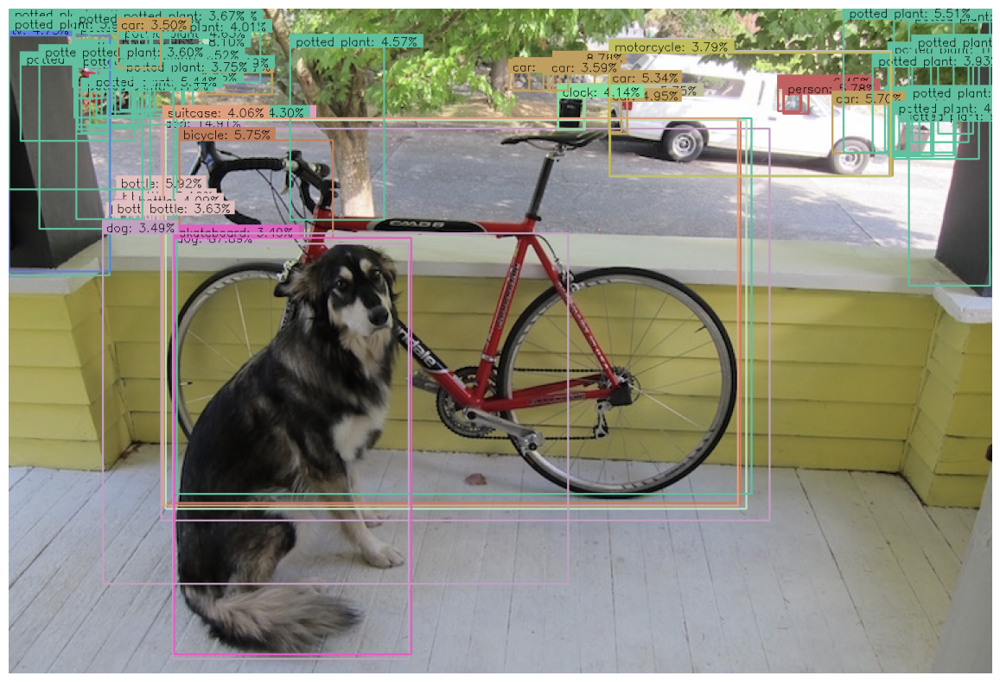

In [17]:
# Call the model
results = od_model(images[0])

# Convert dictionary values to numpy arrays
results = {key:value.numpy() for key,value in results.items()}

# remove batch dimension
image = np.squeeze(images[0])

# Process first sample image
img_bbox = process_detection(image, results, min_det_thresh=0)

plt.figure(figsize=[15,10])
plt.imshow(img_bbox)
plt.axis('off')

### Display results with `min_det_thresh=0.3`

(-0.5, 1517.5, 1027.5, -0.5)

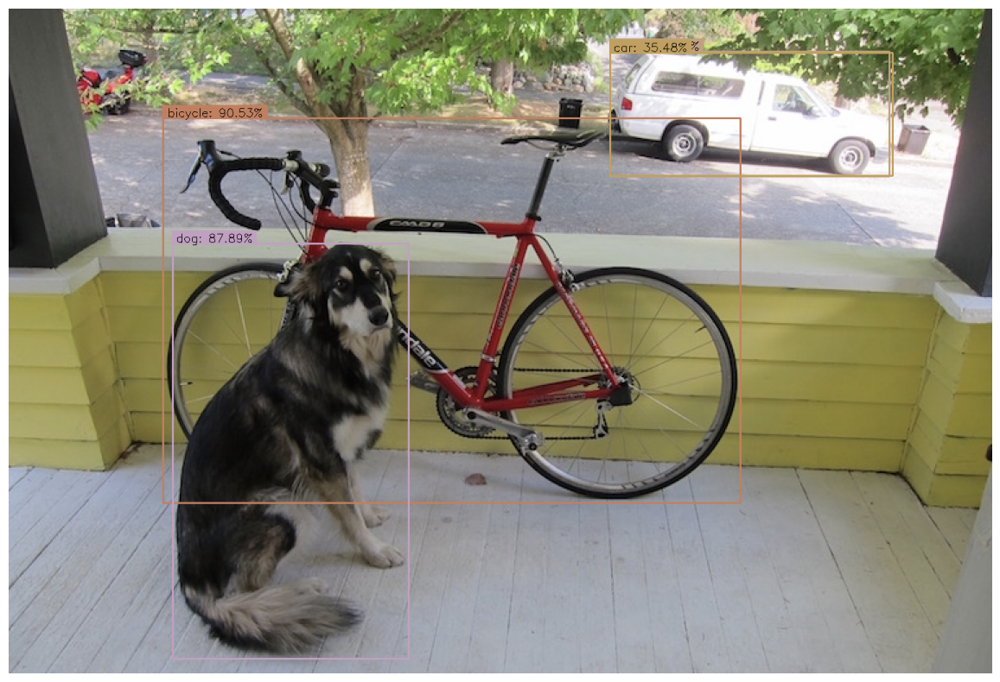

In [18]:
# Call the model
results = od_model(images[0])

# Convert dictionary values to numpy arrays
results = {key:value.numpy() for key,value in results.items()}

# remove batch dimension
image = np.squeeze(images[0])

# Process first sample image
img_bbox = process_detection(image, results, min_det_thresh=0.3)

plt.figure(figsize=[15,10])
plt.imshow(img_bbox)
plt.axis('off')

## 3 Formalize the implementation

### run_inference()

In [19]:
# Running inference
def run_inference(images, model):

    results_list = []
    for img in images:
        result = model(img)
        result = {key:value.numpy() for key, value in result.items()}

        results_list.append(result)
    
    return results_list

In [20]:
# Perform inference on each image and store results in a list
results_list = run_inference(images, od_model)

Loop over each of the images and use results to annotate a copy of the image displayed to console

IndexError: list index out of range

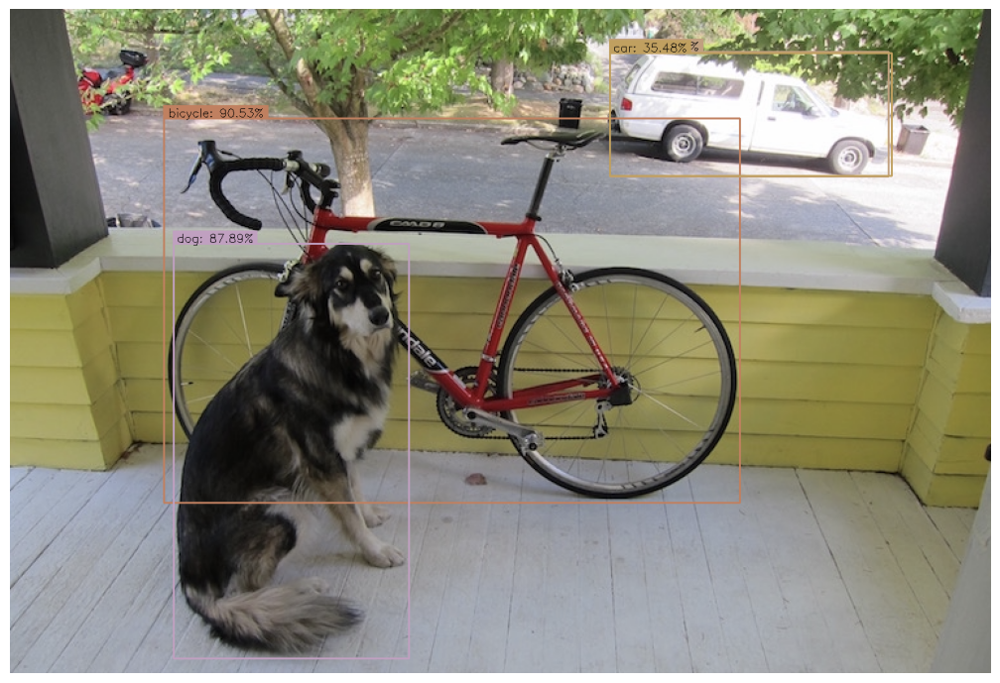

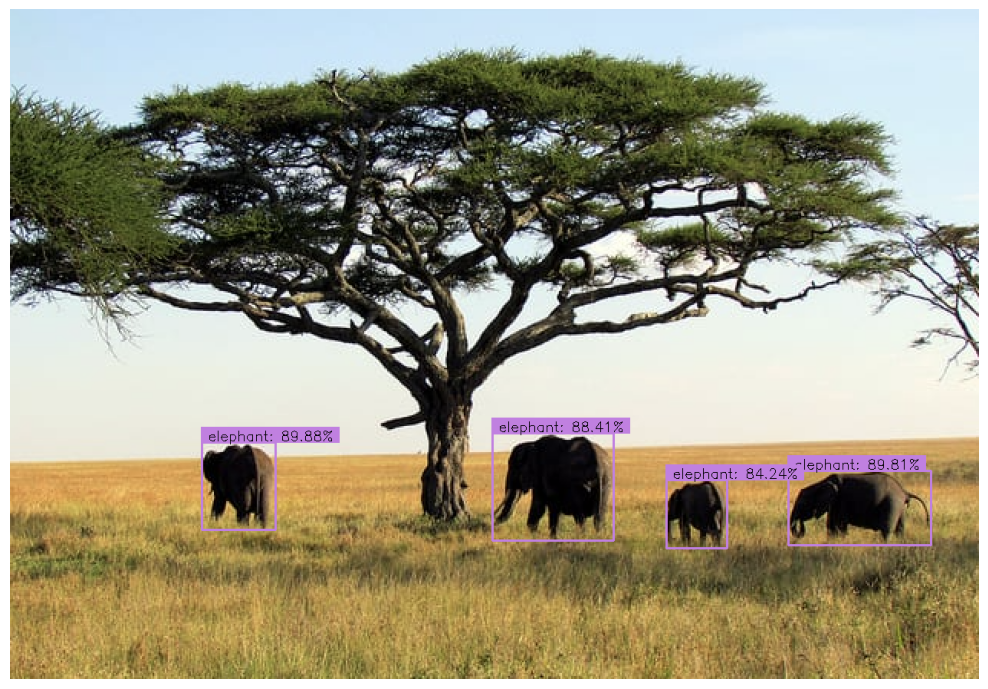

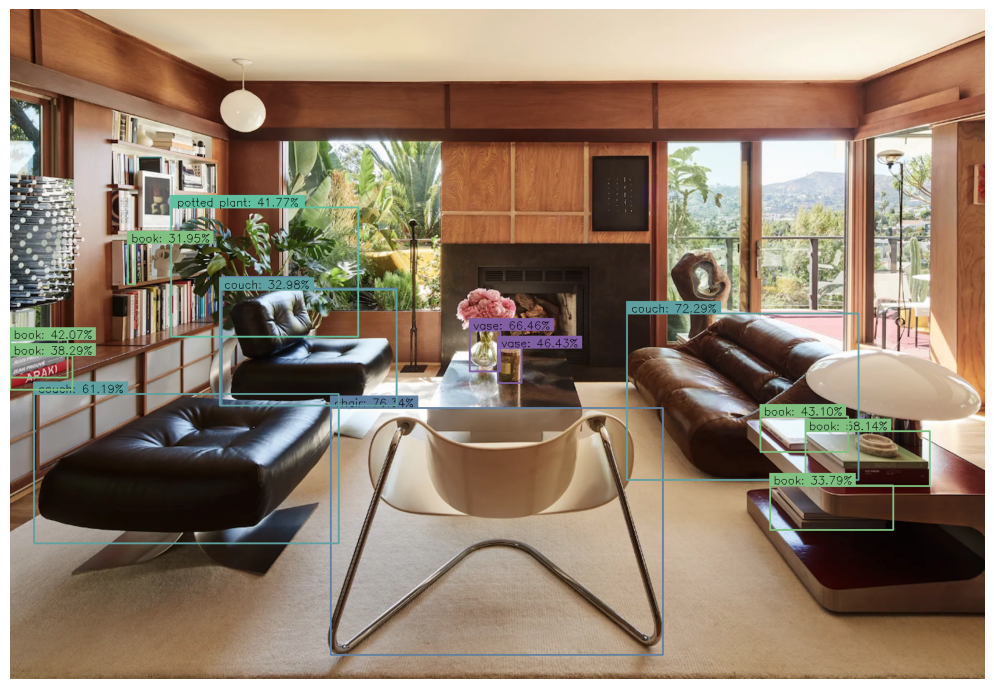

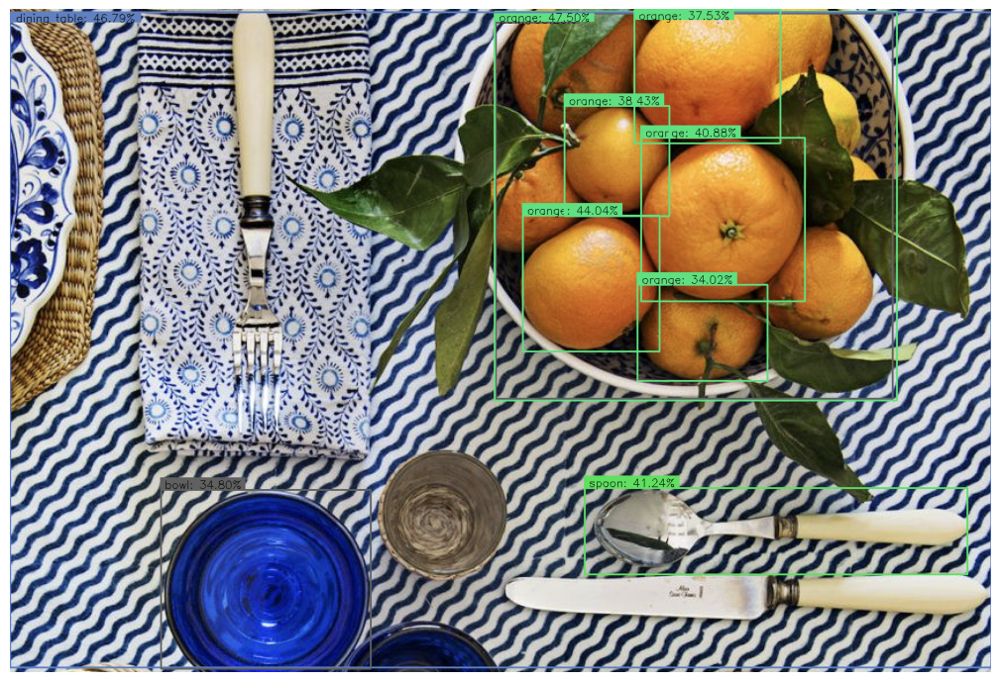

In [22]:
for idx in range(len(image)):

    # Remove batch dimension
    image = np.squeeze(images[idx])

    # Generate anotated image
    image_bbox = process_detection(image, results_list[idx], min_det_thresh=.31)

    # Display annotated image
    plt.figure(figsize=[20,10*len(images)])
    plt.subplot(len(images),1,idx+1)
    plt.imshow(image_bbox)
    plt.axis('off')